In [1]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("andrewmvd/helmet-detection")

print("Path to dataset files:", path)

100%|██████████| 391M/391M [00:10<00:00, 40.9MB/s]

Extracting files...


Path to dataset files: /root/.cache/kagglehub/datasets/andrewmvd/helmet-detection/versions/1


In [2]:
!mv /root/.cache/kagglehub/datasets/andrewmvd/helmet-detection/versions/1 /content/helmet-detection


In [3]:
import os
import random
import xml.etree.ElementTree as ET
import cv2
import matplotlib.pyplot as plt

image_dir = "/content/helmet-detection/annotations"
annotation_dir = "/content/helmet-detection/images"


In [5]:
import os

print("Images folder contents:", os.listdir("/content/helmet-detection/images")[:10])
print("Annotations folder contents:", os.listdir("/content/helmet-detection/annotations")[:10])


Images folder contents: ['BikesHelmets36.png', 'BikesHelmets214.png', 'BikesHelmets101.png', 'BikesHelmets197.png', 'BikesHelmets546.png', 'BikesHelmets277.png', 'BikesHelmets43.png', 'BikesHelmets572.png', 'BikesHelmets160.png', 'BikesHelmets447.png']
Annotations folder contents: ['BikesHelmets26.xml', 'BikesHelmets469.xml', 'BikesHelmets249.xml', 'BikesHelmets502.xml', 'BikesHelmets177.xml', 'BikesHelmets668.xml', 'BikesHelmets359.xml', 'BikesHelmets611.xml', 'BikesHelmets312.xml', 'BikesHelmets758.xml']


In [7]:
import os

image_files = os.listdir("/content/helmet-detection/images")
print(image_files[:10])


['BikesHelmets36.png', 'BikesHelmets214.png', 'BikesHelmets101.png', 'BikesHelmets197.png', 'BikesHelmets546.png', 'BikesHelmets277.png', 'BikesHelmets43.png', 'BikesHelmets572.png', 'BikesHelmets160.png', 'BikesHelmets447.png']


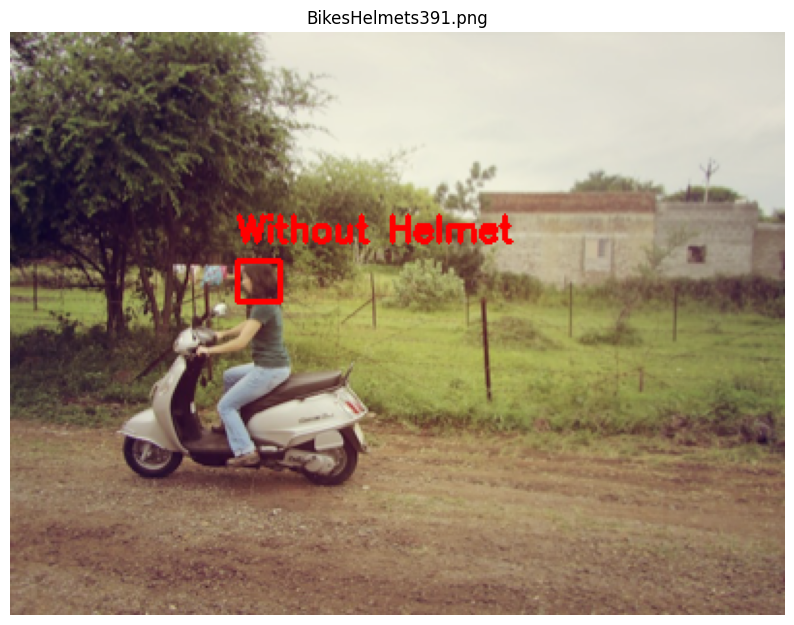

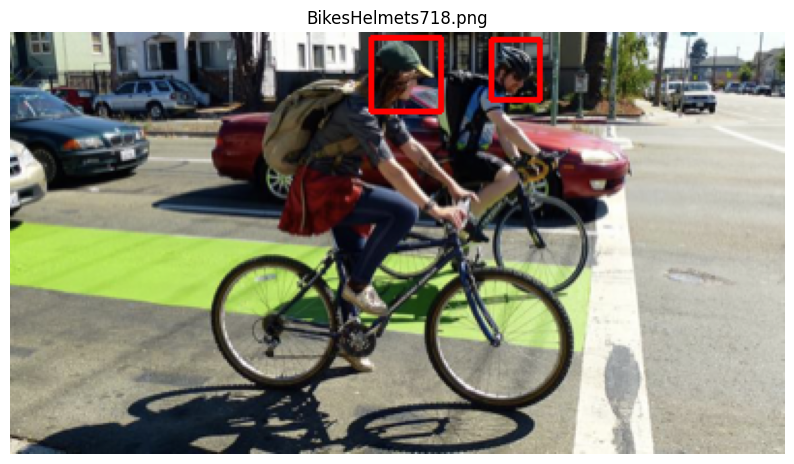

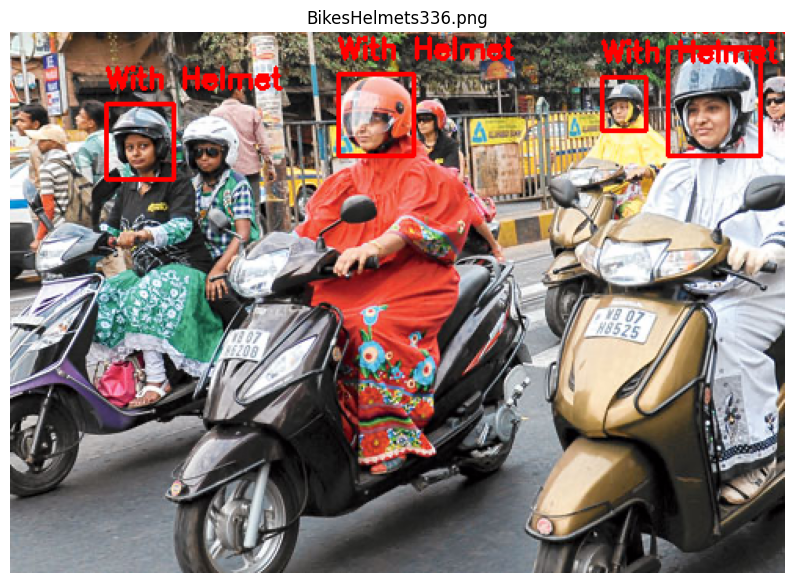

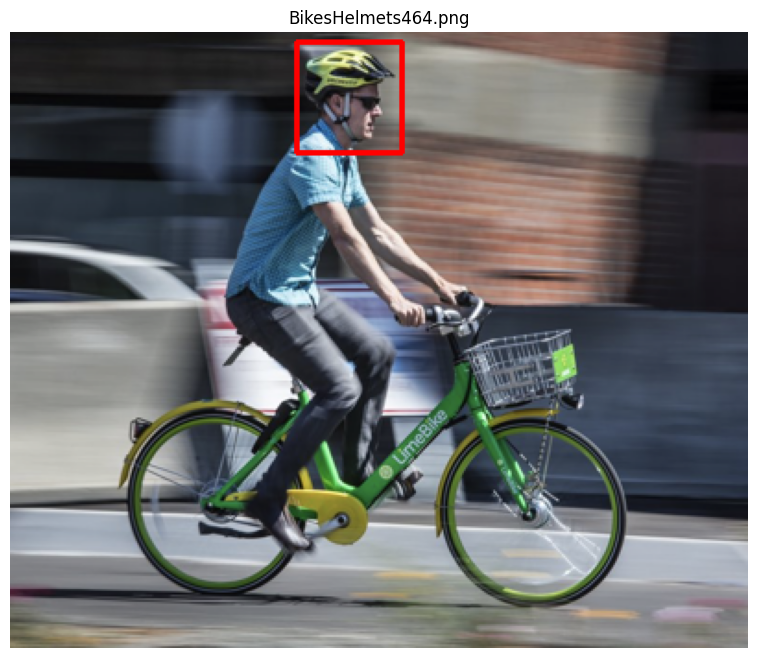

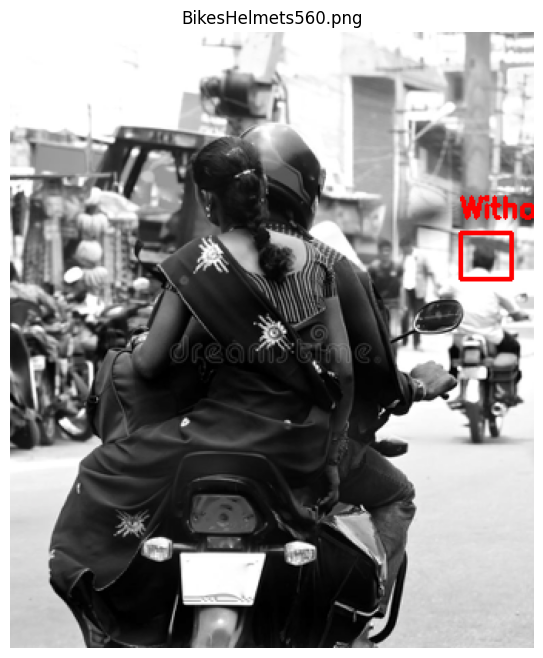

...

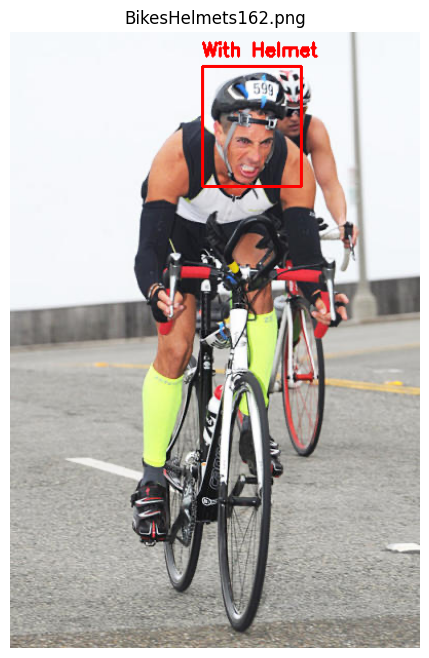

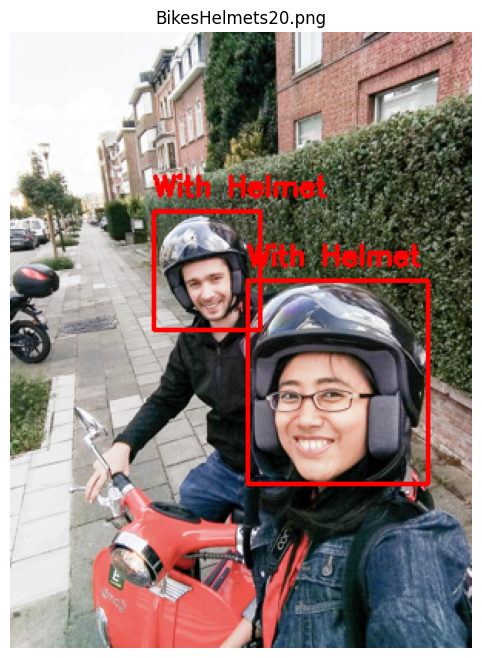

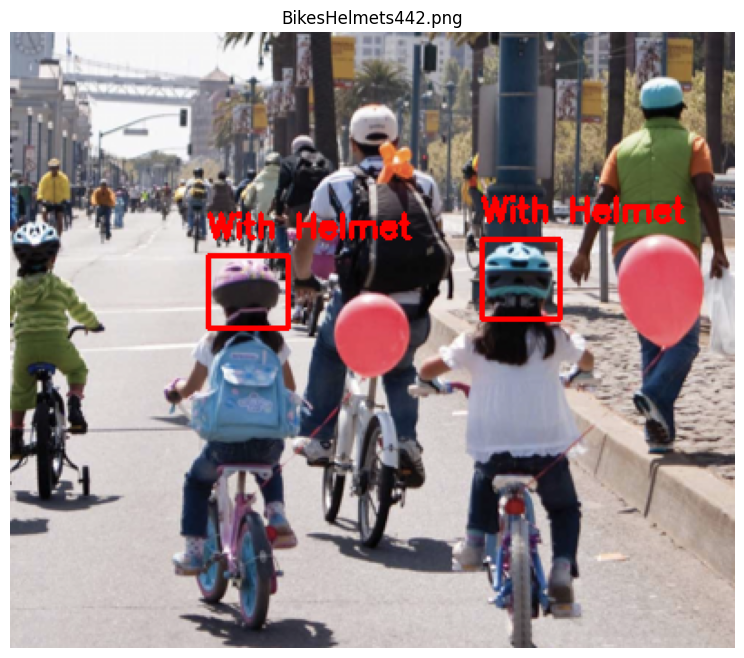

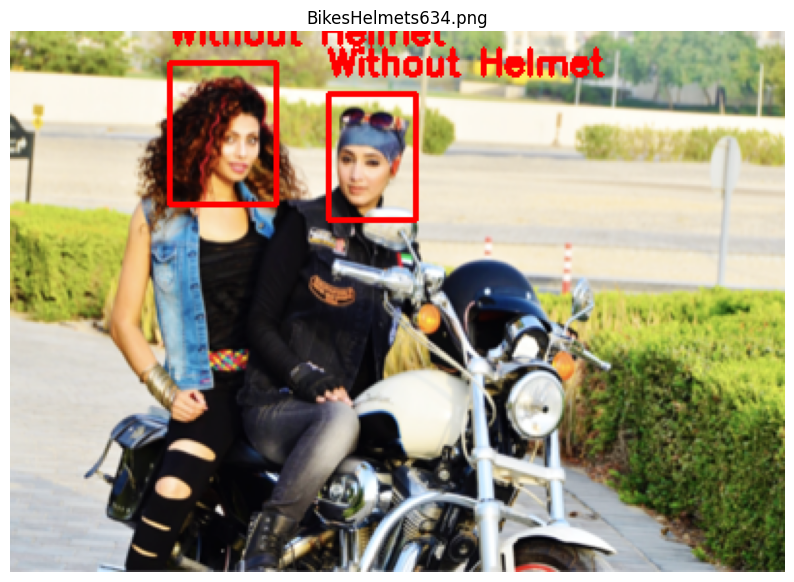

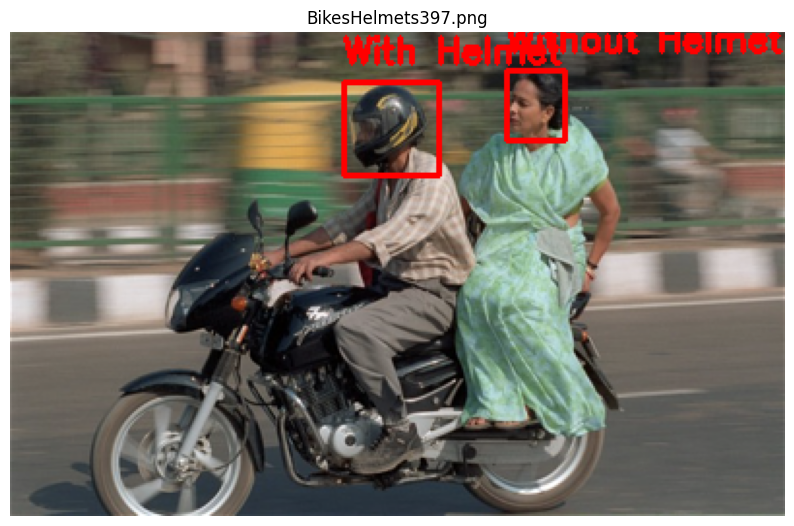

In [9]:
import os
import random
import xml.etree.ElementTree as ET
import cv2
import matplotlib.pyplot as plt

# Paths
images_dir = "/content/helmet-detection/images"
annotations_dir = "/content/helmet-detection/annotations"

# List of image files (PNG)
image_files = [f for f in os.listdir(images_dir) if f.endswith('.png')]

# Randomly pick 20 images
sample_images = random.sample(image_files, 20)

def visualize_image_with_boxes(image_name):
    image_path = os.path.join(images_dir, image_name)
    annotation_name = image_name.replace('.png', '.xml')
    annotation_path = os.path.join(annotations_dir, annotation_name)

    # Check if annotation exists
    if not os.path.exists(annotation_path):
        print(f"Annotation file not found: {annotation_path}")
        return

    # Load image
    img = cv2.imread(image_path)
    if img is None:
        print(f"Failed to load image: {image_path}")
        return
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Parse XML
    tree = ET.parse(annotation_path)
    root = tree.getroot()

    # Draw boxes
    for obj in root.findall('object'):
        bbox = obj.find('bndbox')
        if bbox is None:
            continue
        xmin = int(bbox.find('xmin').text)
        ymin = int(bbox.find('ymin').text)
        xmax = int(bbox.find('xmax').text)
        ymax = int(bbox.find('ymax').text)

        cv2.rectangle(img, (xmin, ymin), (xmax, ymax), (255, 0, 0), 2)
        label = obj.find('name').text
        cv2.putText(img, label, (xmin, ymin-10), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255,0,0), 2)

    plt.figure(figsize=(10, 8))
    plt.imshow(img)
    plt.axis('off')
    plt.title(image_name)
    plt.show()

# Visualize 20 random images with bounding boxes
for img_name in sample_images:
    visualize_image_with_boxes(img_name)


In [10]:
import shutil

# Create folders if not exist
train_img_dir = "/content/helmet-dataset/train/images"
train_ann_dir = "/content/helmet-dataset/train/annotations"
val_img_dir = "/content/helmet-dataset/val/images"
val_ann_dir = "/content/helmet-dataset/val/annotations"

for d in [train_img_dir, train_ann_dir, val_img_dir, val_ann_dir]:
    os.makedirs(d, exist_ok=True)

# Split ratio
split_ratio = 0.8
num_train = int(len(image_files) * split_ratio)

# Shuffle image files again for consistent split
random.shuffle(image_files)

train_files = image_files[:num_train]
val_files = image_files[num_train:]

# Move or copy files to new folders
for f in train_files:
    shutil.copy(os.path.join(images_dir, f), train_img_dir)
    ann_file = f.replace('.png', '.xml')
    shutil.copy(os.path.join(annotations_dir, ann_file), train_ann_dir)

for f in val_files:
    shutil.copy(os.path.join(images_dir, f), val_img_dir)
    ann_file = f.replace('.png', '.xml')
    shutil.copy(os.path.join(annotations_dir, ann_file), val_ann_dir)

print(f"Train images: {len(train_files)}, Validation images: {len(val_files)}")


Train images: 611, Validation images: 153


In [13]:
import os
import xml.etree.ElementTree as ET

annotations_dir = "/content/helmet-detection/annotations"

class_names_found = set()

for filename in os.listdir(annotations_dir):
    if not filename.endswith('.xml'):
        continue
    xml_path = os.path.join(annotations_dir, filename)
    tree = ET.parse(xml_path)
    root = tree.getroot()

    for obj in root.findall('object'):
        class_name = obj.find('name').text
        class_names_found.add(class_name)

print("Classes found in XML files:", class_names_found)


Classes found in XML files: {'Without Helmet', 'With Helmet'}


In [14]:
import xml.etree.ElementTree as ET
import os

def convert_xml_to_yolo(xml_file, img_width, img_height, classes_map):
    tree = ET.parse(xml_file)
    root = tree.getroot()

    yolo_annotations = []

    for obj in root.findall('object'):
        cls = obj.find('name').text
        if cls not in classes_map:
            continue  # Skip classes not in your defined classes

        cls_id = classes_map[cls]

        bbox = obj.find('bndbox')
        xmin = float(bbox.find('xmin').text)
        ymin = float(bbox.find('ymin').text)
        xmax = float(bbox.find('xmax').text)
        ymax = float(bbox.find('ymax').text)

        # Convert to YOLO format
        x_center = ((xmin + xmax) / 2) / img_width
        y_center = ((ymin + ymax) / 2) / img_height
        width = (xmax - xmin) / img_width
        height = (ymax - ymin) / img_height

        yolo_annotations.append(f"{cls_id} {x_center:.6f} {y_center:.6f} {width:.6f} {height:.6f}")

    return yolo_annotations


In [15]:
import cv2

# Create labels directories
train_label_dir = "/content/helmet-dataset/train/labels"
val_label_dir = "/content/helmet-dataset/val/labels"
os.makedirs(train_label_dir, exist_ok=True)
os.makedirs(val_label_dir, exist_ok=True)

def convert_folder(img_dir, ann_dir, label_dir, classes_map):
    for img_file in os.listdir(img_dir):
        if not img_file.endswith('.png'):
            continue

        img_path = os.path.join(img_dir, img_file)
        ann_file = img_file.rsplit('.',1)[0] + '.xml'
        ann_path = os.path.join(ann_dir, ann_file)

        if not os.path.exists(ann_path):
            print(f"Annotation not found for {img_file}, skipping")
            continue

        # Read image size
        img = cv2.imread(img_path)
        h, w = img.shape[:2]

        yolo_ann = convert_xml_to_yolo(ann_path, w, h, classes_map)

        # Save YOLO txt file
        label_file = os.path.join(label_dir, img_file.rsplit('.',1)[0] + '.txt')
        with open(label_file, 'w') as f:
            for line in yolo_ann:
                f.write(line + '\n')

# Classes mapping
classes_map = {'Without Helmet': 0, 'With Helmet': 1}

# Convert train and val sets
convert_folder(train_img_dir, train_ann_dir, train_label_dir, classes_map)
convert_folder(val_img_dir, val_ann_dir, val_label_dir, classes_map)

print("Conversion to YOLO format done!")


Conversion to YOLO format done!


In [16]:
dataset_yaml = """
train: /content/helmet-dataset/train/images
val: /content/helmet-dataset/val/images

nc: 2

names: ['Without Helmet', 'With Helmet']
"""

yaml_path = "/content/helmet-dataset/helmet_dataset.yaml"
with open(yaml_path, 'w') as f:
    f.write(dataset_yaml)

print(f"YOLOv8 dataset config saved to {yaml_path}")


YOLOv8 dataset config saved to /content/helmet-dataset/helmet_dataset.yaml


In [17]:
!pip install ultralytics --quiet


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 39.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 26.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 95.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 57.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 14.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 7.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 105.2 MB/s eta 0:00:00


In [18]:
from ultralytics import YOLO

# Load a YOLOv8 model - 'yolov8n.pt' is nano (small, fast)
model = YOLO('yolov8n.pt')

# Train the model
model.train(data='/content/helmet-dataset/helmet_dataset.yaml',
            epochs=30,      # You can increase/decrease this
            imgsz=640,      # Image size
            batch=16,       # Batch size (adjust depending on GPU)
            name='helmet_detection_yolov8')


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


100%|██████████| 6.25M/6.25M [00:00<00:00, 41.6MB/s]


Ultralytics 8.3.144 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/helmet-dataset/helmet_dataset.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=30, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=helmet_detection_yolov8, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, 

100%|██████████| 755k/755k [00:00<00:00, 37.3MB/s]

Overriding model.yaml nc=80 with nc=2

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

Model summary: 129 layers, 3,011,238 parameters, 3,011,222 gradients, 8.2 GFLOPs

Transferred 319/355 items from pretrained weights
Freezing layer 'model.22.dfl.conv.weight'
AMP: running Automatic Mixed Precision (AMP) checks...


100%|██████████| 5.35M/5.35M [00:00<00:00, 165MB/s]


AMP: checks passed ✅
train: Fast image access ✅ (ping: 0.0±0.0 ms, read: 87.3±26.1 MB/s, size: 524.9 KB)


train: Scanning /content/helmet-dataset/train/labels... 611 images, 3 backgrounds, 13 corrupt: 100%|██████████| 611/611 [00:02<00:00, 207.44it/s]

train: /content/helmet-dataset/train/images/BikesHelmets140.png: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     547.68        84.5      132.16         151]
train: /content/helmet-dataset/train/images/BikesHelmets205.png: ignoring corrupt image/label: non-normalized or out of bounds coordinates [      263.5          43          85          74]
train: /content/helmet-dataset/train/images/BikesHelmets279.png: ignoring corrupt image/label: non-normalized or out of bounds coordinates [      194.5          56         103         100]
train: /content/helmet-dataset/train/images/BikesHelmets326.png: ignoring corrupt image/label: non-normalized or out of bounds coordinates [        157        56.5          86          97]
train: /content/helmet-dataset/train/images/BikesHelmets343.png: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     682.27       150.5      118.22         107]
train: /content/helmet-dataset/train/images/BikesHelmet

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 195.9±241.3 MB/s, size: 604.5 KB)


val: Scanning /content/helmet-dataset/val/labels... 153 images, 0 backgrounds, 2 corrupt: 100%|██████████| 153/153 [00:00<00:00, 192.02it/s]

val: /content/helmet-dataset/val/images/BikesHelmets103.png: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     408.72      81.502      71.037      83.004]
val: /content/helmet-dataset/val/images/BikesHelmets75.png: ignoring corrupt image/label: non-normalized or out of bounds coordinates [        471       290.5          82         109         761       291.5          84          97       466.5         297         109         118]
val: New cache created: /content/helmet-dataset/val/labels.cache


Plotting labels to runs/detect/helmet_detection_yolov8/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001667, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/helmet_detection_yolov8
Starting training for 30 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/30      2.04G      1.526      2.871      1.258         17        640: 100%|██████████| 38/38 [00:22<00:00,  1.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.31it/s]

                   all        151        252    0.00456      0.754      0.347      0.188



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/30      2.44G      1.415      1.778      1.188         25        640: 100%|██████████| 38/38 [00:15<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.96it/s]

                   all        151        252      0.579      0.104      0.365      0.234



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/30      2.46G        1.4      1.523      1.174         22        640: 100%|██████████| 38/38 [00:15<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.71it/s]

                   all        151        252      0.671      0.462      0.589       0.34



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/30      2.48G      1.393      1.511      1.175         34        640: 100%|██████████| 38/38 [00:15<00:00,  2.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.61it/s]

                   all        151        252      0.673       0.63      0.625      0.349



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/30      2.49G      1.422      1.407      1.185         23        640: 100%|██████████| 38/38 [00:16<00:00,  2.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.86it/s]

                   all        151        252      0.625      0.654      0.656      0.372



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/30      2.52G      1.372      1.321      1.162         13        640: 100%|██████████| 38/38 [00:15<00:00,  2.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.36it/s]

                   all        151        252      0.529      0.671      0.648      0.378



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/30      2.53G      1.337      1.224       1.18         15        640: 100%|██████████| 38/38 [00:15<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.49it/s]

                   all        151        252      0.646      0.741      0.685      0.383



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/30      2.55G      1.328      1.146      1.142         19        640: 100%|██████████| 38/38 [00:16<00:00,  2.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.95it/s]

                   all        151        252      0.614       0.72      0.711      0.408



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/30      2.56G      1.341      1.118      1.155         14        640: 100%|██████████| 38/38 [00:14<00:00,  2.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.40it/s]

                   all        151        252      0.675      0.728      0.702      0.417



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/30      2.58G      1.341      1.071      1.151         18        640: 100%|██████████| 38/38 [00:14<00:00,  2.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.07it/s]

                   all        151        252      0.615      0.818      0.696      0.406



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/30       2.6G      1.312      1.048      1.123         23        640: 100%|██████████| 38/38 [00:15<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.55it/s]

                   all        151        252        0.7      0.709      0.735      0.427



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/30      2.62G      1.327      1.015       1.12         41        640: 100%|██████████| 38/38 [00:14<00:00,  2.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.28it/s]

                   all        151        252       0.68      0.754      0.702      0.406



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/30      2.63G      1.297     0.9677      1.131         17        640: 100%|██████████| 38/38 [00:14<00:00,  2.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.55it/s]

                   all        151        252      0.719      0.712      0.717      0.387



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/30      2.65G      1.279     0.9174      1.108         16        640: 100%|██████████| 38/38 [00:14<00:00,  2.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.53it/s]

                   all        151        252      0.749       0.75      0.774      0.453



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/30      2.66G      1.239     0.8785      1.104         13        640: 100%|██████████| 38/38 [00:15<00:00,  2.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.52it/s]

                   all        151        252      0.734      0.709      0.765      0.443



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/30      2.69G      1.252     0.8805      1.096         16        640: 100%|██████████| 38/38 [00:15<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.00it/s]

                   all        151        252      0.635      0.761      0.732      0.426



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/30       2.7G      1.216     0.8343      1.083         12        640: 100%|██████████| 38/38 [00:14<00:00,  2.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.50it/s]

                   all        151        252       0.73      0.754      0.762      0.439



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/30      2.72G      1.207     0.8059      1.085         16        640: 100%|██████████| 38/38 [00:14<00:00,  2.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.24it/s]

                   all        151        252      0.764      0.739      0.787      0.469



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/30      2.73G      1.219     0.8504      1.064         17        640: 100%|██████████| 38/38 [00:15<00:00,  2.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.48it/s]

                   all        151        252      0.758      0.718       0.77      0.458



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/30      2.75G      1.199     0.7801      1.081         23        640: 100%|██████████| 38/38 [00:14<00:00,  2.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.45it/s]

                   all        151        252      0.719      0.735      0.761      0.439


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/30      2.77G      1.187     0.7823      1.096         17        640: 100%|██████████| 38/38 [00:17<00:00,  2.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.49it/s]

                   all        151        252      0.674      0.705      0.698        0.4



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/30      2.79G      1.145     0.7609      1.081         19        640: 100%|██████████| 38/38 [00:14<00:00,  2.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.53it/s]

                   all        151        252      0.727      0.761      0.765      0.459



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/30       2.8G      1.147     0.7208      1.068          9        640: 100%|██████████| 38/38 [00:14<00:00,  2.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.61it/s]

                   all        151        252      0.693      0.773       0.77       0.46



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/30      2.82G      1.142     0.6883      1.075         18        640: 100%|██████████| 38/38 [00:15<00:00,  2.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.61it/s]

                   all        151        252       0.74      0.763        0.8      0.466



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/30      2.83G      1.116     0.6661      1.067         10        640: 100%|██████████| 38/38 [00:14<00:00,  2.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.42it/s]

                   all        151        252      0.673       0.83      0.794      0.469



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/30      2.86G      1.086       0.64      1.056          9        640: 100%|██████████| 38/38 [00:14<00:00,  2.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.33it/s]

                   all        151        252      0.767      0.727      0.772      0.457



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/30      2.87G       1.07     0.6369      1.043         12        640: 100%|██████████| 38/38 [00:15<00:00,  2.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.54it/s]

                   all        151        252      0.753      0.767      0.779      0.461



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/30      2.89G      1.057     0.6029      1.034          9        640: 100%|██████████| 38/38 [00:14<00:00,  2.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.30it/s]

                   all        151        252      0.779      0.716      0.788       0.47



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/30       2.9G      1.061     0.5927      1.029         11        640: 100%|██████████| 38/38 [00:15<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.81it/s]

                   all        151        252      0.769      0.739      0.782      0.452



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/30      2.93G      1.036     0.5883       1.03         14        640: 100%|██████████| 38/38 [00:14<00:00,  2.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.08it/s]

                   all        151        252      0.754      0.752      0.776      0.456



30 epochs completed in 0.154 hours.
Optimizer stripped from runs/detect/helmet_detection_yolov8/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/helmet_detection_yolov8/weights/best.pt, 6.2MB

Validating runs/detect/helmet_detection_yolov8/weights/best.pt...
Ultralytics 8.3.144 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,006,038 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.48it/s]


                   all        151        252      0.674       0.83      0.794       0.47
        Without Helmet         50         78      0.578      0.769      0.706      0.369
           With Helmet        109        174       0.77      0.891      0.881      0.571
Speed: 0.3ms preprocess, 4.5ms inference, 0.0ms loss, 4.2ms postprocess per image
Results saved to runs/detect/helmet_detection_yolov8


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7d9e5d8aa050>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.04804

In [21]:
# Load it to save under a custom name or path:
model = YOLO('runs/detect/helmet_detection_yolov8/weights/best.pt')
model.save('helmet_detection_final.pt')  # Save wherever you want

In [23]:
# Load the best model weights after training
best_model = YOLO('runs/detect/helmet_detection_yolov8/weights/best.pt')

# Run validation on the val set (defined in your yaml)
metrics = best_model.val()

print(metrics)  # Prints mAP, precision, recall, etc.


Ultralytics 8.3.144 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,006,038 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 3044.6±1393.2 MB/s, size: 486.1 KB)


val: Scanning /content/helmet-dataset/val/labels.cache... 153 images, 0 backgrounds, 2 corrupt: 100%|██████████| 153/153 [00:00<?, ?it/s]

val: /content/helmet-dataset/val/images/BikesHelmets103.png: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     408.72      81.502      71.037      83.004]
val: /content/helmet-dataset/val/images/BikesHelmets75.png: ignoring corrupt image/label: non-normalized or out of bounds coordinates [        471       290.5          82         109         761       291.5          84          97       466.5         297         109         118]



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.24it/s]


                   all        151        252      0.691      0.827      0.793      0.469
        Without Helmet         50         78      0.599      0.769      0.705      0.366
           With Helmet        109        174      0.783      0.885      0.882      0.573
Speed: 2.9ms preprocess, 9.8ms inference, 0.0ms loss, 3.0ms postprocess per image
Results saved to runs/detect/val
ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7d9e5c899710>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.


image 1/1 /content/images.jpeg: 448x640 2 Without Helmets, 11.0ms
Speed: 2.3ms preprocess, 11.0ms inference, 2.7ms postprocess per image at shape (1, 3, 448, 640)


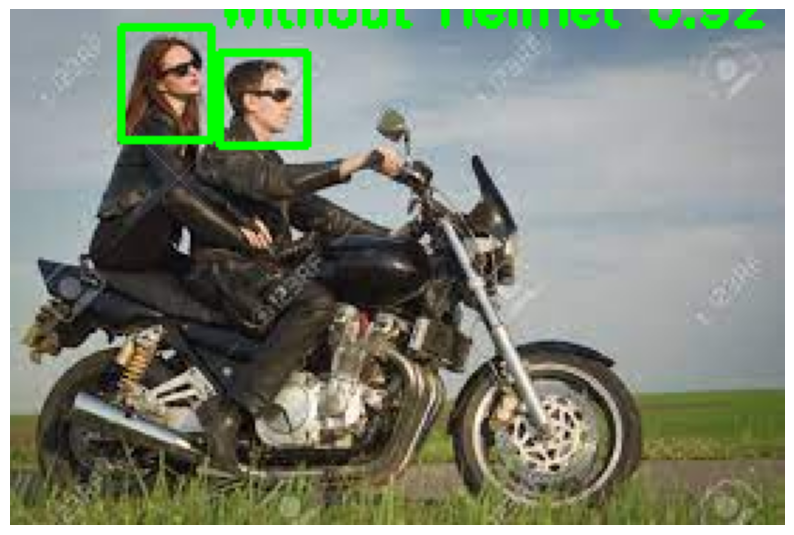

In [27]:
import cv2
from matplotlib import pyplot as plt

# Load trained model weights
model = YOLO('runs/detect/helmet_detection_yolov8/weights/best.pt')

# Path to your test image
image_path = '/content/images.jpeg'  # change as needed

# Run prediction (returns a list of results)
results = model.predict(source=image_path, conf=0.25)  # conf = confidence threshold

# results[0].boxes.xyxy contains bounding box coordinates
# results[0].boxes.cls contains class indices
# results[0].boxes.conf contains confidence scores

# Visualize prediction on the image using OpenCV
img = cv2.imread(image_path)

# Draw boxes & labels
for box, cls, conf in zip(results[0].boxes.xyxy, results[0].boxes.cls, results[0].boxes.conf):
    x1, y1, x2, y2 = map(int, box)
    label = model.names[int(cls)]
    conf_text = f'{conf:.2f}'

    # Draw rectangle
    cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 2)
    # Put label text
    cv2.putText(img, f'{label} {conf_text}', (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0,255,0), 2)

# Convert BGR to RGB for matplotlib display
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(10, 8))
plt.imshow(img_rgb)
plt.axis('off')
plt.show()


In [28]:
import shutil
from google.colab import files
import os

# List of folders to include (manually excluding 'sample_data')
folders_to_zip = ['helmet-dataset', 'helmet-detection', 'runs']

for folder in folders_to_zip:
    zip_filename = f"{folder}.zip"
    # Zip the folder
    shutil.make_archive(folder, 'zip', folder)
    # Download the zip file
    files.download(zip_filename)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>